<a href="https://colab.research.google.com/github/Programapython/detector_osteoartritis/blob/main/practicas/practica6/Practica_07A__SOLON.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**ESCUELA DE INGENIERÍA MECATRÓNICA**

## `PROCESAMIENTO DIGITAL DE SEÑALES E IMÁGENES`

### `Docente: Ms. Ing. Emerson Maximo Asto Rodriguez`

```
Práctica 7A: Filtrado en el espacio
```

### 1. Implemente un algoritmo que permita realizar la correlacion 2D de una imagen de MxN con una mascara de mxn
* El algoritmo debe retornar una imagen de las mismas dimensiones que la imagen de entrada, recuerde que el "padding" usualmente se hace con ceros, no obstante se puede duplicar filas o columnas del borde, o hacerlo mediante un espejo sobre el borde.*

* El algoritmo tambien puede obtener la solución sin necesidad del "padding", agregando varias condicionales que permitan solo ponderar con los datos coincidentes.*

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def filtro_espacial(imagen, filtro):
    M, N = imagen.shape #Obteniendo las dimensiones de la imagen
    m, n = filtro.shape #Obteniendo las dimensiones del filtro

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * filtro
            resultado[i-filas_add, j-columnas_add] = np.sum(multiplicacion)

    return resultado

1. ¿Por qué es importante el uso de técnicas de padding en la aplicación de filtros espaciales?
2. Explica qué es un kernel (o máscara) en un filtro espacial y cómo influye su tamaño en el procesamiento de imágenes.

1. Evita que el borde de la imagen se vea afectado por los filtros.
2. Una mascara es una operación realizada sobre los píxeles de una imagen con el fin de procesarla. A mayor tamaño el suavizado aumenta, sin embargo tienden a desaparecer los detalles más finos.

In [3]:
img = np.arange(100).reshape(10,10)
filtro = np.ones((5,7))

print(img)
print(filtro)

img_filtrada = filtro_espacial(img, filtro)

[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]
 [30 31 32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47 48 49]
 [50 51 52 53 54 55 56 57 58 59]
 [60 61 62 63 64 65 66 67 68 69]
 [70 71 72 73 74 75 76 77 78 79]
 [80 81 82 83 84 85 86 87 88 89]
 [90 91 92 93 94 95 96 97 98 99]]
[[1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]]


In [ ]:
img_ruido = cv2.imread('../Imagenes/ruido.png', 0)/255

filtro = np.ones((5,7))
filtro = filtro/np.sum(filtro)

img_ruido_filtrada = filtro_espacial(img_ruido, filtro)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_ruido, cmap='gray')
plt.subplot(122)
plt.imshow(img_ruido_filtrada, cmap='gray', vmin=0, vmax=1)
plt.show()

### 2.- Implemente un algoritmo que permita mejorar solo los pixeles oscuros y de bajo contraste
*Puede modificar levemente el algoritmo realizado en el enunciado **1** para lograr el objetivo*

In [26]:
def filtro_espacial_estadistico(imagen, selem = np.ones((3,3))):
    media_global = np.mean(imagen)
    desv_global = np.std(imagen)

    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            media_loc = np.mean(multiplicacion)
            desv_loc = np.std(multiplicacion)

            if (media_loc<media_global) and (desv_loc<0.8*desv_global) and (desv_loc>0.2*desv_global):
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]*1.5
            else:
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]

    return resultado

1. ¿Cuál es el objetivo de este algoritmo y qué tipo de imágenes se benefician más de su aplicación?
2. Vecindad y Kernel: ¿Cómo se define la vecindad de un píxel en este código y cuál es la importancia de la variable selem en este contexto?
3. ¿Qué efecto tiene el factor de escala de 1.5 en los píxeles mejorados y cómo podría ajustarse para obtener diferentes resultados?

1. El objetivo del filtro es identificar y realzar regiones de la imagen que presentan una media local menor que la media global y una desviación estándar que se encuentra dentro de un rango específico. Las imagenes más beneficiadas son aquellas que presentan detalles débiles, ruido bajo y texturas suaves.
2. La vecindad de un pixel es el área que cubre el kernel cuando se centra en este. La variable selem define la vecindad de un pixel así como los pesos que toma cada uno.
3. El factor de escala sirve para resaltar un píxel de tal manera que los detalles finos se vuelven más notorios. Se puede ajustar de acuerdo a lo que se pretende mostrar.

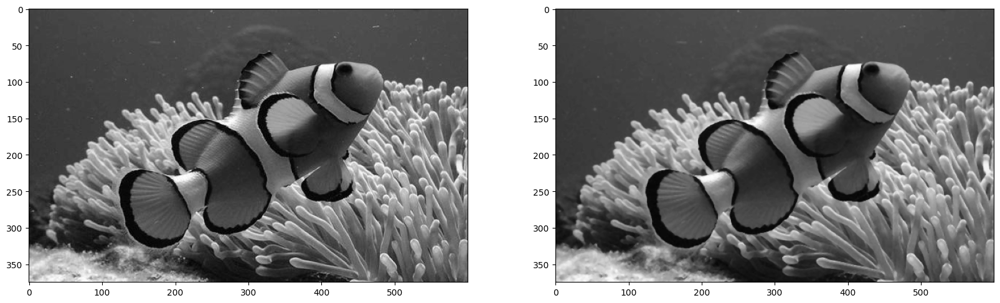

In [23]:
img_delfin = np.uint16(cv2.imread("Imagenes/ruido.jpg", 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(20,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 3.- Implemente los filtros estadisticos min, max, moda y mediana


In [5]:
from scipy.stats import mode

def filtro_espacial_estadistico(imagen, selem = np.ones((3,3)), filter_type='median'):
    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

#     img_pad = np.zeros((M+ filas_adicionales*2, N + columnas_adicionales*2))
    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            if filter_type =='min':
                resultado[i-filas_add, j-columnas_add] = np.min(multiplicacion)
            elif filter_type == 'max':
                resultado[i-filas_add, j-columnas_add] = np.max(multiplicacion)
            elif filter_type == 'median':
                resultado[i-filas_add, j-columnas_add] = np.median(multiplicacion)
            elif filter_type == 'mode':
                resultado[i-filas_add, j-columnas_add] = mode(multiplicacion, axis=None)[0][0]

    return resultado

1. ¿Qué es un filtro estadístico en el procesamiento de imágenes y cómo se aplica en el código mostrado?
2. ¿Qué diferencias existen entre los filtros de tipo min, max, median y mode? Explica en qué situaciones sería adecuado usar cada tipo.

Rpta.:
1. Un filtro estadístico en el procesamiento de imágenes es una técnica que utiliza funciones estadísticas para modificar los valores de los píxeles dentro de una ventana (o máscara) alrededor de cada píxel en la imagen. Estos filtros se aplican para mejorar la imagen, reducir ruido y resaltar características específicas, dependiendo de la operación estadística usada.

2. Para cada tipo de filtros, existe una aplicación diferente, a continuación se elaboró una lista para las principales características de cada filtro estadístico:

* Filtro Mínimo (Min): Selecciona el valor más bajo en la ventana y lo asigna al píxel central. Este filtro es efectivo para eliminar ruido brillante en fondos oscuros, destacando así las áreas más oscuras de la imagen.

* Filtro Máximo (Max): Selecciona el valor más alto en la ventana y lo asigna al píxel central. Se utiliza para eliminar ruido oscuro en fondos brillantes, resaltando las áreas luminosas.

* Filtro Mediano (Median): Calcula la mediana de los valores en la ventana y lo asigna al píxel central. Este filtro es particularmente efectivo para reducir ruido de tipo sal y pimienta (o ruido impulsivo), preservando detalles y bordes en la imagen.

* Filtro de Moda (Mode): Determina el valor más frecuente en la ventana y lo asigna al píxel central. Es adecuado para imágenes categóricas o mapas de segmentos, ya que ayuda a mantener áreas homogéneas.



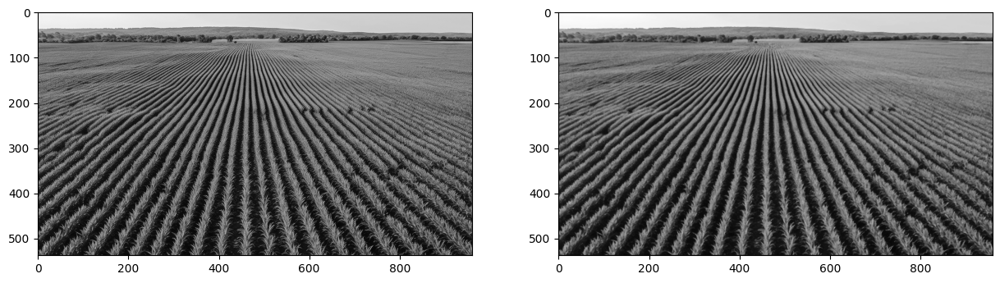

In [12]:
#MINIMO
img_delfin = np.uint16(cv2.imread('Imagenes/campo.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

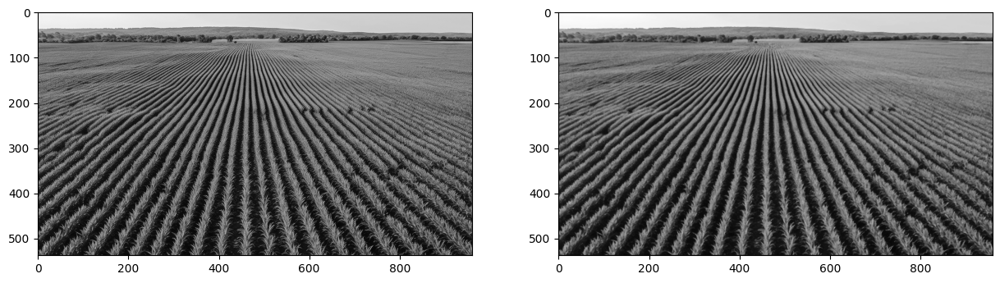

In [8]:
#MAX
img_delfin = np.uint16(cv2.imread('Imagenes/campo.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

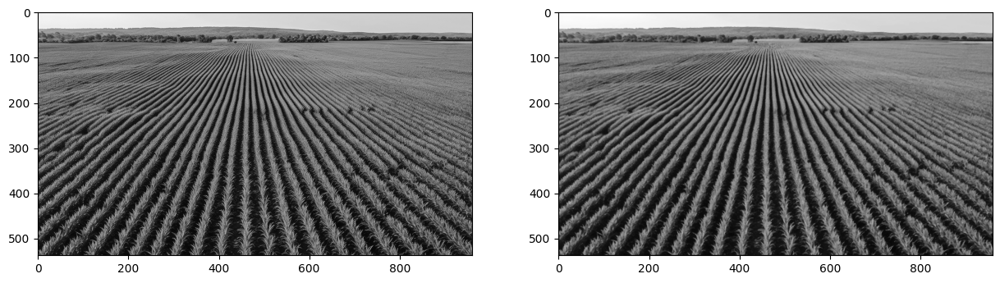

In [10]:
#MEDIANA
img_delfin = np.uint16(cv2.imread('Imagenes/campo.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

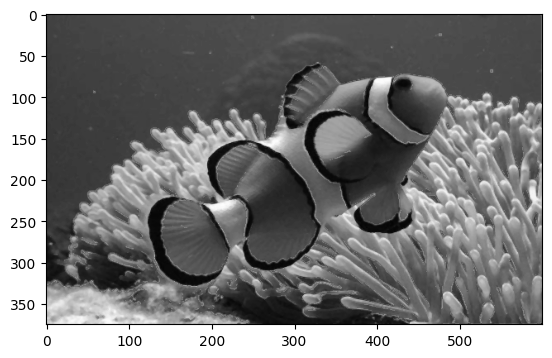

In [29]:
img_median_mode = filtro_espacial_estadistico(img_delfin_filtrada)
plt.imshow(img_median_mode, cmap='gray')
plt.show()

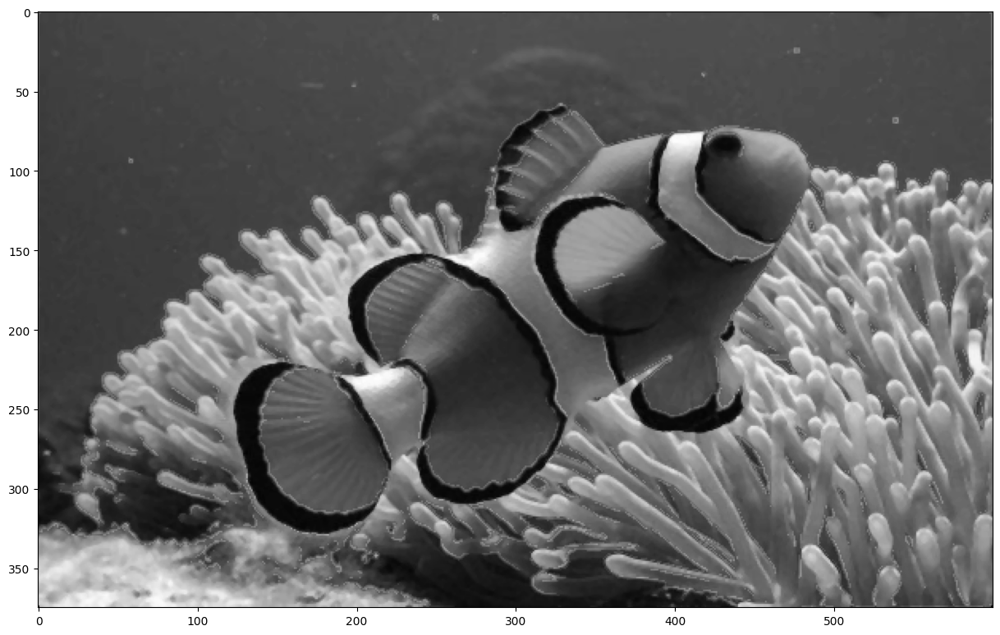

In [30]:
plt.figure(figsize=(15,15))
plt.imshow(img_median_mode, cmap='gray')
plt.show()

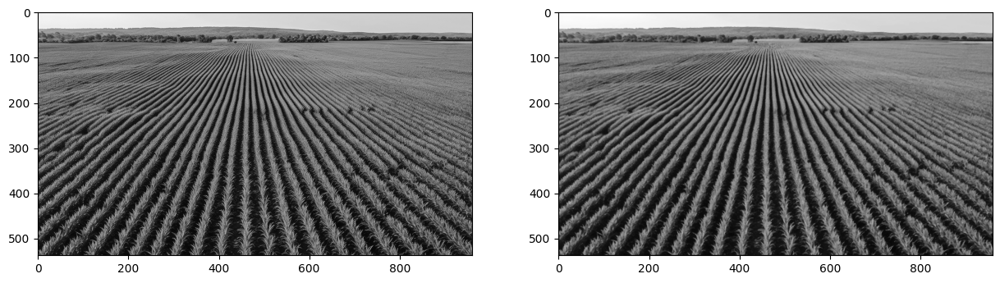

In [16]:
#MODA
img_delfin = np.uint16(cv2.imread('Imagenes/campo.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 4.- Implemente los filtros espaciales de suavizado y nitidez explicados en clase

Utilizando la funcion **convolve2d(img, kernel, mode= "same")** de **scipy.signal** y los kernels:
(tambien se puede usar **correlate2d**)
* Promedio
* Gaussiano
* Laplaciano


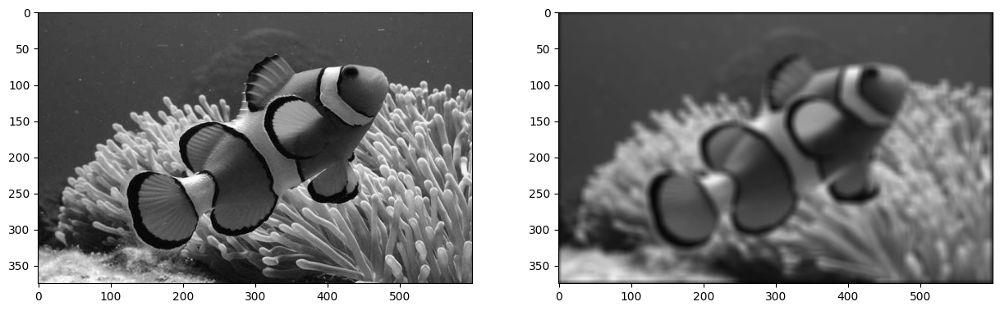

In [17]:
#PROMEDIO
from scipy import signal

img = cv2.imread("Imagenes/ruido.jpg", 0)/255
kernel = np.ones((11,11))/121

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

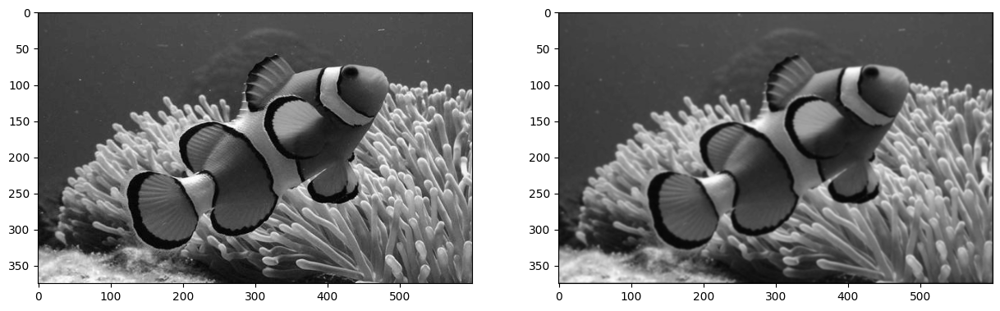

In [18]:
#PROMEDIO GAUSSIANO
from scipy import signal

img = cv2.imread("Imagenes/ruido.jpg", 0)/255
# kernel = np.array([[1,2,1], [2,4,2], [1,2,1]])/16
kernel = np.array([1,4,7,4,1])*np.array([[1],[4],[7],[4],[1]])
kernel = kernel/np.sum(kernel)

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

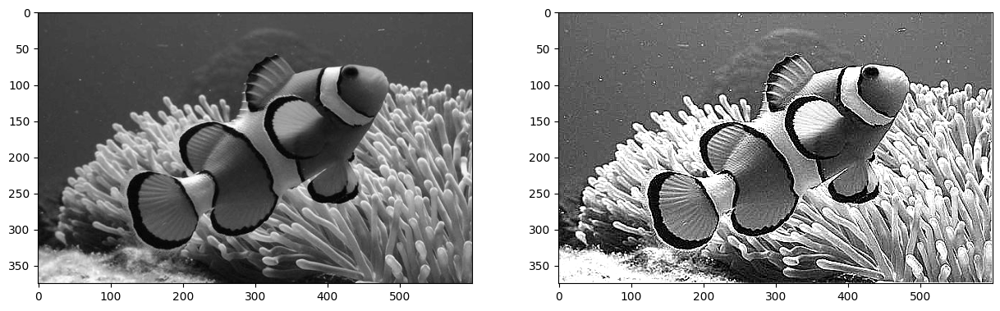

In [19]:
#LAPLACIANO
from scipy import signal
A = 1.5
img = cv2.imread("Imagenes/ruido.jpg", 0)/255
kernel = np.array([[-1,-1,-1], [-1,A+8,-1], [-1,-1,-1]])

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

**Utilizando OpenCV:**
* cv2.blur(img, (Tamaño_kernel))
* cv2.GaussianBlur(img,(Tamaño_kernel),desviacion_estandar)
* cv2.medianBlur(img,Tamaño_kernel)
* cv2.bilateralFilter(img,tamaño_kernel,sigmacolor,sigmaspace)  [Mas info](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html)

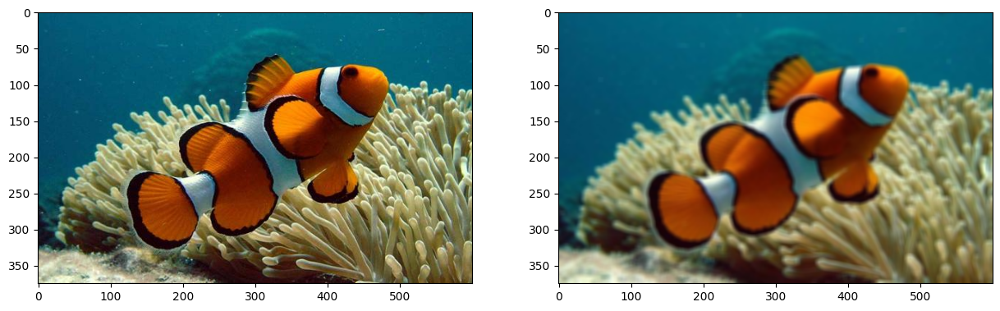

In [20]:
img = cv2.imread("Imagenes/ruido.jpg")[..., ::-1]

out = cv2.blur(img, (7,7))

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

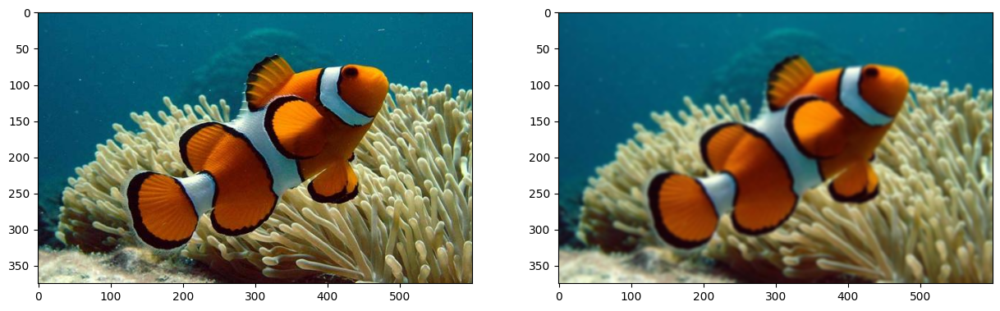

In [21]:
out = cv2.GaussianBlur(img,(7,7), 2)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

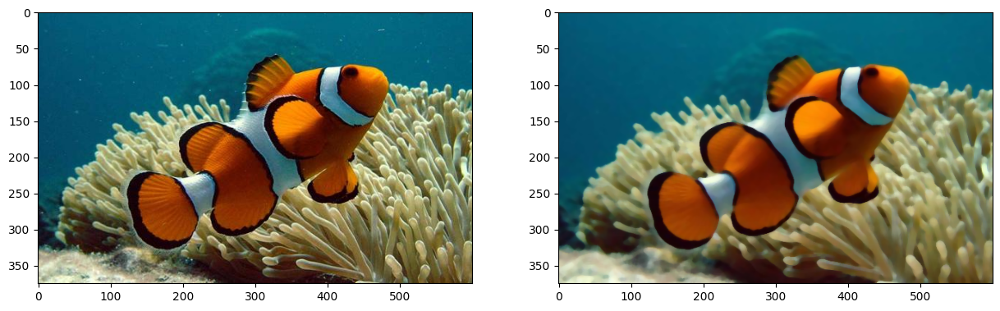

In [32]:
img_joker = cv2.imread("Imagenes/ruido.jpg")[..., ::-1]

img_joker_filtrada = cv2.medianBlur(img_joker, 7)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_joker, cmap='gray')
plt.subplot(122)
plt.imshow(img_joker_filtrada, cmap='gray')
plt.show()

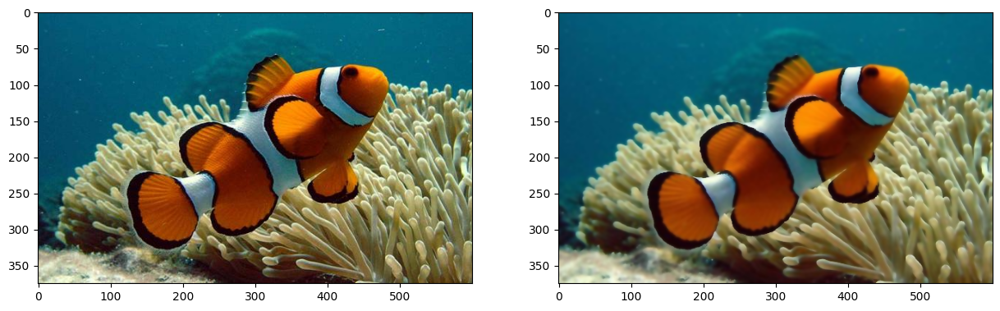

In [25]:
out = cv2.bilateralFilter(img,7, 160, 160)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la diferencia fundamental entre los filtros de suavizado (como el de promedio y el Gaussiano) y los filtros de nitidez (como el Laplaciano)?
2. ¿Cuáles son las principales diferencias en los resultados obtenidos al aplicar un filtro de promedio versus un filtro Gaussiano?
3. ¿Qué propiedades tiene el kernel Laplaciano y cómo contribuye a la nitidez de la imagen? ¿Qué efectos visuales produce al aplicarse a una imagen?
4. ¿Qué significa el argumento mode="same" en la función convolve2d y cómo afecta el tamaño de la imagen resultante después de aplicar el filtro?

1. Mientras que en el suavizado, el propósito es reducir el ruido o eliminar los detalles finos de la imagen buscando atenuar cambios bruscos de intensidad entre pixeles "suavizando" la imagen. En cambio, los filtros de nitidez resaltan los bordes y detalles importantes en las imágenes, lo que aumenta la claridad y definición de estas.

2. Amnbos son filtros de suavizado, pero su aplicación va enfocada a distintos aspectos, por ejemplo el filtro promedio busca atenuar los demás pixeles tomando como base el valor promedio de sus pixeles vecinos, teniendo un efecto de distorcionar la imagen eliminando en cierto porcentaje los bordes y disminuyendo los detalles de esta. En cambio, mientras el filtro Gaussiano toma una distribución Gaussiana para calcular los pesos en una ventana de vecinos alrededor de cada píxel, dando mayor importancia a los píxeles cercanos al centro de la ventana y menos a los lejanos, esto proporciona una suavización más "natural" o "suave" de la imagen en comparación con el filtro de promedio, preservando mejor los bordes.

3. El Kernel Laplaciano es un filtro isotrópico que detecta cambios de intensidad en todas las direcciones. Al ser una segunda derivada, el Laplaciano tiende a realzar áreas de cambio abrupto en intensidad (bordes) y a atenuar las áreas uniformes de la imagen. Esto ayuda a detectar areas de cambio de intensidad y resaltando los detalles. Como se puede ver en la imagen anterior, su aplicación resalta significativamente los detalles pequeños y los bordes entre los cambios de intensidad, sin perturbar el fondo de la imagen.

4. Hace que la salida de la convolución tenga el mismo tamaño que la imagen de entrada. Esto se logra agregando ceros alrededor de los bordes de la imagen, lo cual permite que el filtro se aplique en todas las posiciones, incluyendo los bordes.

### 5.- Implemente un algoritmo para muestre el uso de la mascara de desenfoque (unsharp mask) y el filtro de altoaumento (Highboost)

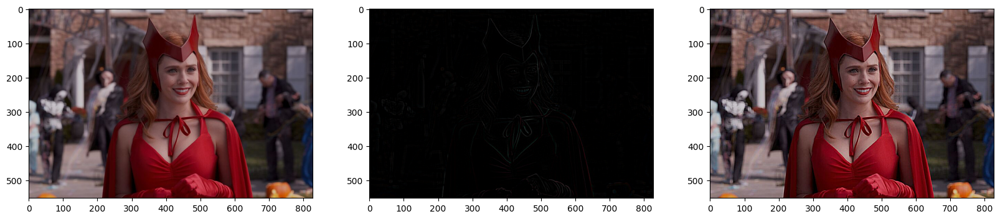

In [33]:
img = cv2.imread("Imagenes/wanda.jpg")[..., ::-1]/255

blur = cv2.blur(img, (7,7))

mask = img - blur

unsharp_image = mask + img

plt.figure(figsize=(20,15))
plt.subplot(131)
plt.imshow(img, cmap="gray")
plt.subplot(132)
plt.imshow(mask, cmap="gray")
plt.subplot(133)
plt.imshow(unsharp_image, cmap='gray', vmin=0, vmax=1)
plt.show()

1. ¿Cómo funciona la máscara de desenfoque (unsharp mask) para realzar los detalles de una imagen, y cuál es el papel del filtro de suavizado en este proceso?
2.  ¿En qué se diferencia el filtro de alto aumento (Highboost) de la máscara de desenfoque estándar, y cómo se puede ajustar el factor de amplificación (boosting factor) para controlar el nivel de realce en la imagen?

1. La máscara de desenfoque aplica primero un filtro de suavizado a la imagen para crear una versión “suavizada” de ella. Luego, resta esta versión suavizada de la imagen original, creando así una máscara que contiene solo los detalles. Finalmente, suma esta máscara a la imagen original para resaltar los detalles.
2. Es similar a la máscara de desenfoque, pero permite multiplicar la máscara de detalles por un número antes de sumarla a la imagen original. Al ajustar el valor de k, se puede controlar cuánto se resaltan los detalles en la imagen.

### 6.- Implemente un algoritmo para mostrar la gradiente de una imagen
**Use las mascaras:**
* Roberts
* Prewit
* Sobel
* Scharr

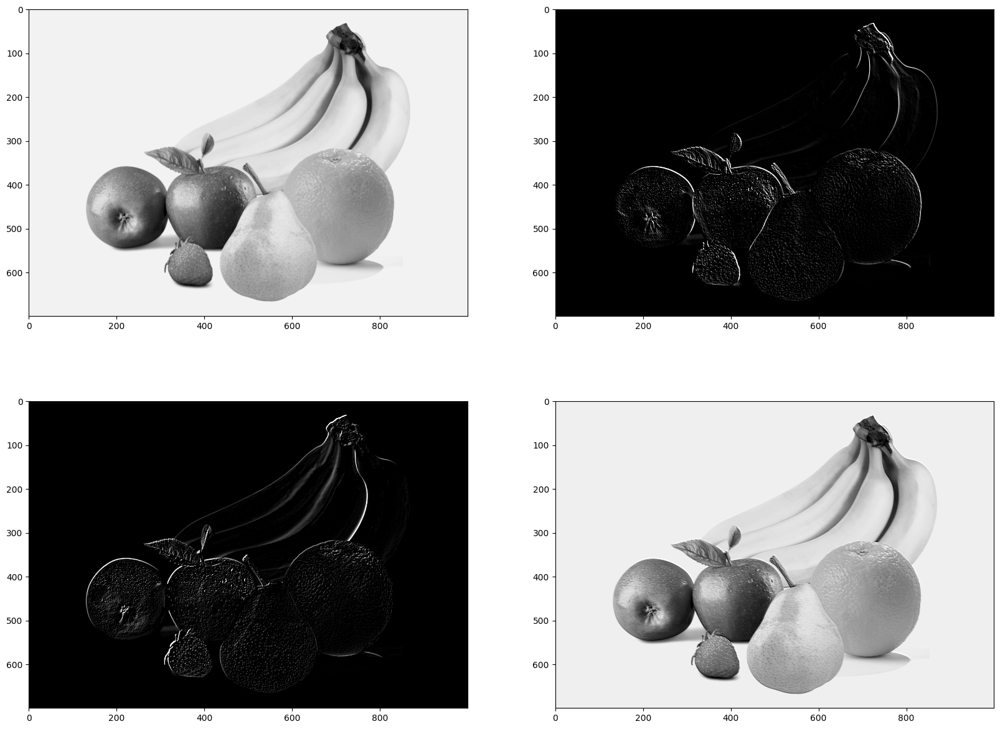

In [36]:
#ROBERTS
img = cv2.imread("Imagenes/fruta.png", 0)/255

kernelh = np.array([[0,-1],[1,0]])
kernelv = np.array([[-1,0],[0,1]])

outh = signal.convolve2d(img, kernelh, mode= "same")
outv = signal.convolve2d(img, kernelv, mode= "same")

outf = outh + outv

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(img, cmap="gray")
plt.subplot(222)
plt.imshow(outh * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(223)
plt.imshow(outv * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(224)
plt.imshow(outf + img, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la característica distintiva de la máscara de Roberts al calcular el gradiente de una imagen, y por qué podría ser menos precisa que otras máscaras?
2. ¿Cómo afectan las máscaras de Sobel y Scharr a la precisión y sensibilidad en la detección de bordes en una imagen? ¿En qué casos se prefiere una sobre la otra?

1. La macara de Roberts usa una matriz de 2x2 para medir el cambio en una imagen, buscando bordes en direcciones diagonales. Es menos precisa porque es muy sensible al ruido y no puede capturar bien los detalles finos.
2. La máscara de Sobel usa matrices de 3x3, que la hacen más resistente al ruido y mejor para captar los bordes en general, mientras que la máscara de Scharr mejora la precisión de la máscara de Sobel con números más altos en sus coeficientes, lo que la hace más sensible y precisa al detectar bordes.
La máscara de Sobel suele usarse en la mayoría de las aplicaciones porque da buenos resultados en general. La máscara de Scharr se usa cuando necesitamos más precisión para detalles finos.